In [ ]:
# import the dataset from my google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [ ]:
import IPython.display as display
import cv2
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
content_path = '/content/gdrive/MyDrive/Colab Notebooks/test/6X.jpg'
style_path = 'gdrive/MyDrive/Colab Notebooks/Shinkai'

In [ ]:
# load dataset
img_data = []
img_name = []
path = style_path
def create_data():
    for img in os.listdir(path):
        f_name = os.path.basename(img)
        img_array = cv2.imread(os.path.join(path,img),cv2. IMREAD_COLOR)
        new_array = cv2.resize(img_array,(1024, 800))
        new_array1 = cv2.cvtColor(new_array, cv2.COLOR_BGR2RGB)
        img_data.append(new_array1)
        img_name.append(f_name)
            
create_data()

In [ ]:
print(len(img_data))
print(len(img_name))

302
302


In [ ]:
print(img_name[1])

3a.png


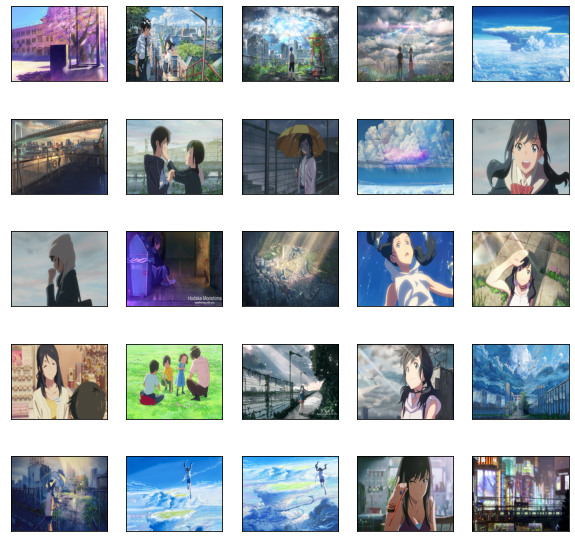

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(img_data[i])
plt.show()

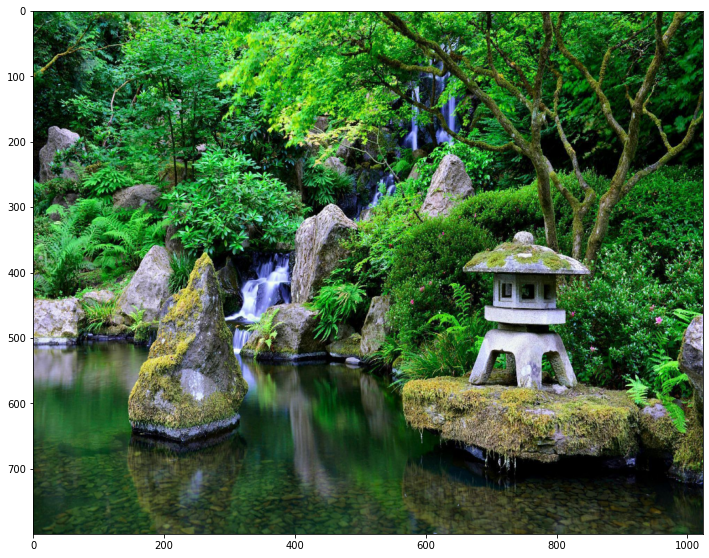

In [ ]:
# load a content image
img = cv2.imread(content_path,cv2.IMREAD_COLOR)
img = cv2.resize(img,(1024,800))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.show()

In [ ]:
# calculate the histogram value for the image
hist = cv2.calcHist([img], [0, 1], None, [180,256],
[0, 180, 0, 256])
hist = cv2.normalize(hist, hist,alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
print(hist)

[[1.0000000e+00 1.4959405e-01 1.6548626e-01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [1.0105372e-01 3.6517534e-01 1.1780964e-01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [6.5814473e-02 7.0823975e-02 1.8863362e-01 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 5.1822420e-04
  5.1822420e-04 5.1822420e-04]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.7274141e-04
  1.7274141e-04 3.4548281e-04]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 6.9096562e-04
  1.7274141e-04 8.6370704e-04]]


In [ ]:
def chi2_distance(histA, histB, eps = 1e-10):
	# compute the chi-squared distance
	d = 0.5 * np.sum([((a - b) ** 2) / (a + b + eps)
		for (a, b) in zip(histA, histB)])
	# return the chi-squared distance
	return d

In [ ]:
# loop through the dataset to perform the histogram comparison and chi2_distance comparison
a = 10
b = []
c = []
for i , k in zip(img_data, img_name):

    hist2 = cv2.calcHist([i], [0, 1], None, [180,256],[0, 180, 0, 256])
    hist2 = cv2.normalize(hist2, hist2,alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

    d1 = cv2.compareHist(hist, hist2, cv2.HISTCMP_BHATTACHARYYA)
    d2 = chi2_distance(hist,hist2)/1000

    e = d1 + d2

    if e < a:
        a = e
        b.append(i)
        c.append(k)

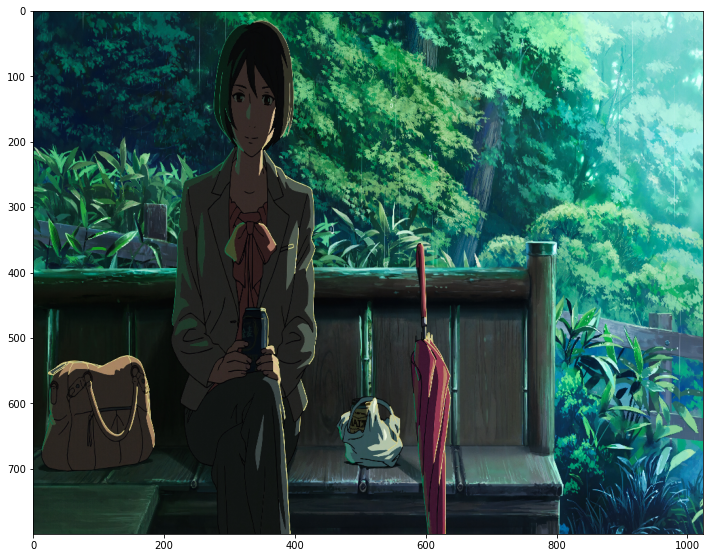

In [ ]:
# show the image with highest similarity
plt.imshow(b[-1])
plt.show()

In [ ]:
print(a)

0.5245232971365852


In [ ]:
print(c[-1])

1006720.jpg


In [ ]:
# get the name of the image
f_name = c[-1]

In [ ]:
# retrieve the previous image from dataset and use as style image
style_path = 'gdrive/MyDrive/Colab Notebooks/Shinkai/' + f_name

In [ ]:
# simple function to load images
def load_img(path_to_img):
  max_dim = 1024
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
# simple function to show the images
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

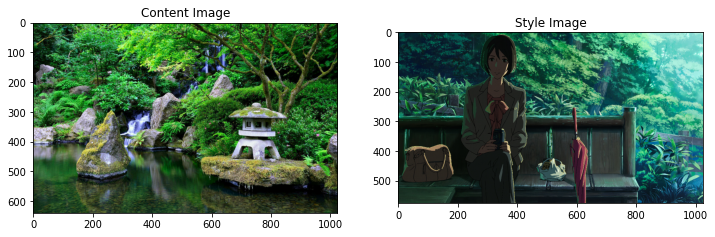

In [ ]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

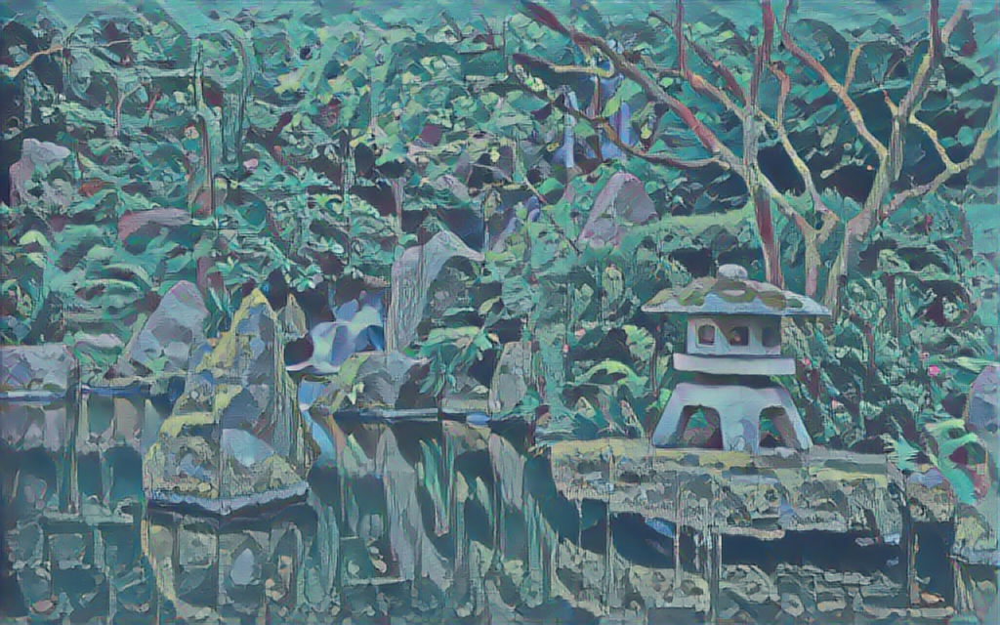

In [ ]:
# fast style transfer using TF-Hub
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [ ]:
# Load a VGG19 and test run it on our image to ensure it's used correctly:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [ ]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('boathouse', 0.60426),
 ('valley', 0.134061),
 ('lakeside', 0.11711065),
 ('castle', 0.073713474),
 ('thatch', 0.014007923)]

In [ ]:
# Now load a VGG19 without the classification head, and list the layer names
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_10
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Choose intermediate layers from the network to represent the style and content of the image:


In [ ]:
content_layers =  [ 'block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
# This following function builds a VGG19 model that returns a list of intermediate layer outputs:
def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  
  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [ ]:
# And to create the model:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 576, 1024, 64)
  min:  0.0
  max:  829.58453
  mean:  19.259668

block2_conv1
  shape:  (1, 288, 512, 128)
  min:  0.0
  max:  4228.1465
  mean:  119.433105

block3_conv1
  shape:  (1, 144, 256, 256)
  min:  0.0
  max:  10059.861
  mean:  126.56802

block4_conv1
  shape:  (1, 72, 128, 512)
  min:  0.0
  max:  14464.473
  mean:  481.20618

block5_conv1
  shape:  (1, 36, 64, 512)
  min:  0.0
  max:  3235.2563
  mean:  39.103046



In [ ]:
# Calculate the style using the tf.linalg.einsum function:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [ ]:
# Build a model that returns the style and content tensors.
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [ ]:
# When called on an image, this model returns the gram matrix (style) of the style_layers and content of the content_layers:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())


Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.029285723
    max:  28149.562
    mean:  872.62646

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  241329.47
    mean:  27584.523

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  3077060.5
    mean:  24398.002

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  24116252.0
    mean:  333970.22

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  79146.09
    mean:  1610.5612

Contents:
   block5_conv2
    shape:  (1, 40, 64, 512)
    min:  0.0
    max:  1285.6823
    mean:  15.026171


In [ ]:
# Set style and content target values:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [ ]:
# Define a tf.Variable to contain the image to optimize
image = tf.Variable(content_image)

In [ ]:
# Define a function to keep the pixel values between 0 and 1:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [ ]:
# Create an optimizer
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)

In [ ]:
# Use a weighted combination of the two losses to get the total loss:
style_weight=1e-2
content_weight=1e5

In [ ]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [ ]:
# Use tf.GradientTape to update the image.
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

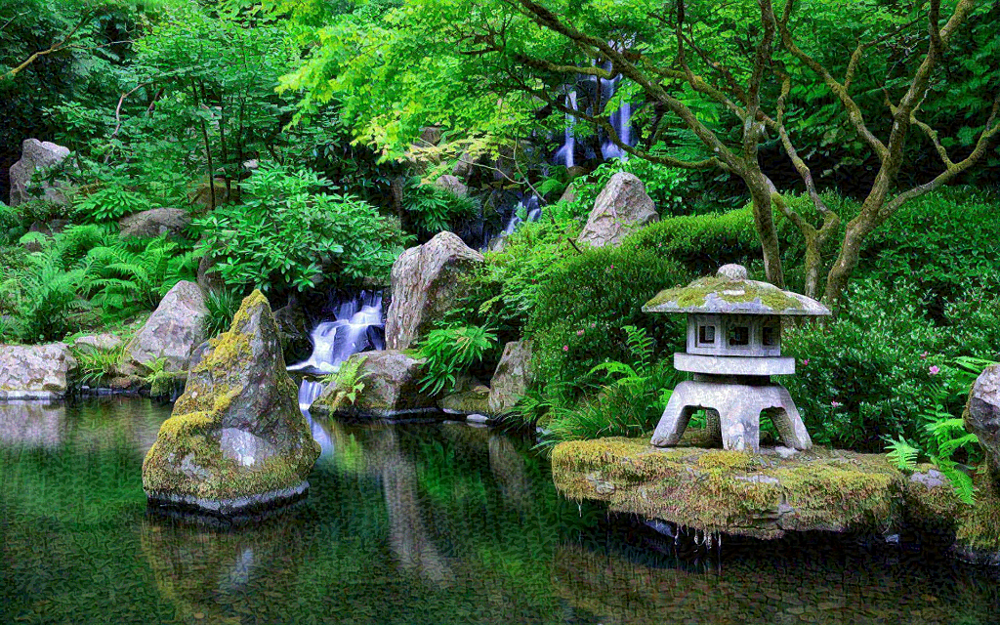

In [ ]:
# run a few steps to test:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

Since it's working, perform a longer optimization:

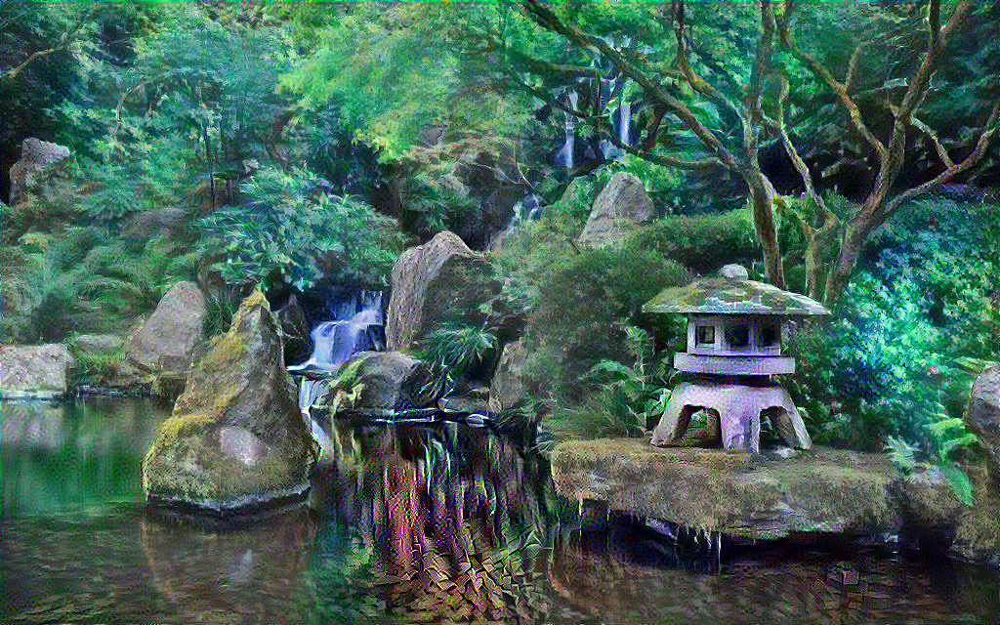

Train step: 2000
Total time: 460.5


In [ ]:
import time
start = time.time()

epochs = 20
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

## Total variation loss

One downside to this basic implementation is that it produces a lot of high frequency artifacts. Decrease these using an explicit regularization term on the high frequency components of the image. In style transfer, this is often called the *total variation loss*:

In [ ]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

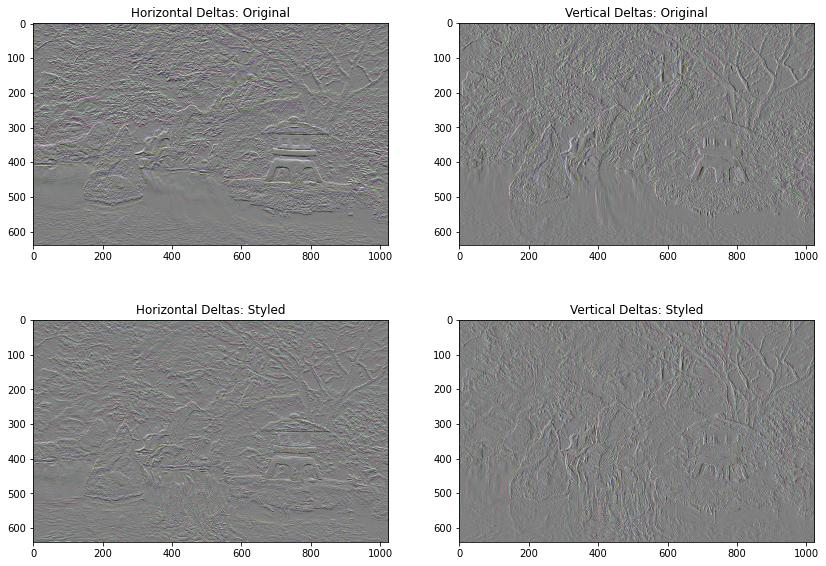

In [ ]:
# Plot high frequency components graphs to shows how the high frequency components have increased.

Also, this high frequency component is basically an edge-detector. You can get similar output from the Sobel edge detector, for example:
x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2, 2, 4)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

The regularization loss associated with this is the sum of the squares of the values:

In [ ]:
def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [ ]:
total_variation_loss(image).numpy()

430932.3

That demonstrated what it does. There's no need to implement it by myself, TensorFlow includes a standard implementation:

In [ ]:
tf.image.total_variation(image).numpy()

array([430932.3], dtype=float32)

## Re-run the optimization

Choose a weight for the `total_variation_loss`:

In [ ]:
total_variation_weight=15

include it in the `train_step` function:

In [ ]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

Reinitialize the optimization variable:

In [ ]:
image = tf.Variable(content_image)

Run the optimization:

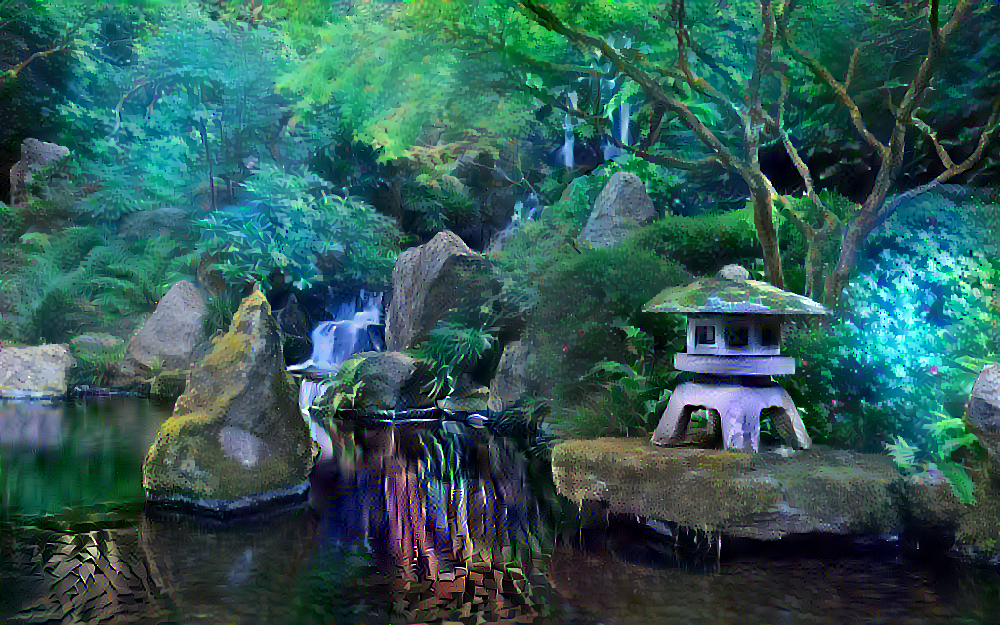

Train step: 2000
Total time: 468.1


In [ ]:
import time
start = time.time()

epochs = 20
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Finally, save the result:

In [ ]:
file_name = 'stylized-image16.png'
tensor_to_image(image).save(file_name)

try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download(file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>